Script to explore the results of Spatialscope

Agathe, started : 15/05/2025

In [1]:
## Imports
import sys
import os
import warnings

warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import anndata
import scanpy as sc

import matplotlib.pyplot as plt
import openslide
from PIL import Image

import mygene

from src_custom.utils_custom import *

In [7]:
slides = [
    "17P04394",
    "18P06762",
    # "18P08140",
    # "18P06593",
    # "18P03122",
    # "18P02831",
    # "17P02529",
]
slide = slides[0]

In [10]:
results_dir = "/home/agathes/work/results"
sc_data_dir = os.path.join(
    results_dir,
    "spatialscope_deconv/third_run/Sc_cellxgene_normalised.h5ad",
)
sc_adata = sc.read_h5ad(sc_data_dir)
sp_adata_dir = os.path.join(
    results_dir,
    "spatialscope_deconv/third_run/deconv_normalised/",
    slide,
    "sp_adata.h5ad",
)
sp_adata = sc.read_h5ad(sp_adata_dir)
gene_exp_dir = os.path.join(
    results_dir,
    "spatialscope_deconv/third_run/deconv_normalised/",
    slide,
    "decomposed_gene_exp.h5ad",
)
gene_adata = sc.read_h5ad(gene_exp_dir)

In [9]:
# END_INDEX = sp_adata.obs.shape[0] - (sp_adata.obs["cell_count"] == 0).sum()

In [10]:
# CHUNK_SIZE = 200
# spot_ranges = []
# start = 0
# while start < END_INDEX:
#     end = start + CHUNK_SIZE
#     if end > END_INDEX:
#         end = END_INDEX
#     spot_ranges.append(f"{start},{end}")
#     start = end

# print("Found spot ranges:", spot_ranges)

### Nuclei segmentation and cell identification

In [ ]:
cell_sp_data = sp_adata.uns["cell_locations"]
cell_sp_data

,x,y,spot_index,cell_index,cell_nums,discrete_label,discrete_label_ct
0,4102.386935,1074.256281,AACACCTACTATCGAA-1,AACACCTACTATCGAA-1_0,11,7,tumor-endothelial cell
1,4099.823009,1089.964602,AACACCTACTATCGAA-1,AACACCTACTATCGAA-1_1,11,9,tumor-fibroblast
2,4133.993421,1108.651316,AACACCTACTATCGAA-1,AACACCTACTATCGAA-1_2,11,9,tumor-fibroblast
3,4085.781609,1055.689655,AACACCTACTATCGAA-1,AACACCTACTATCGAA-1_3,11,9,tumor-fibroblast
4,4128.666667,1075.186275,AACACCTACTATCGAA-1,AACACCTACTATCGAA-1_4,11,9,tumor-fibroblast
...,...,...,...,...,...,...,...
34554,3443.592593,8051.061728,TGTTGGCCTACACGTG-1,TGTTGGCCTACACGTG-1_11,16,9,tumor-fibroblast
34555,3453.375000,8064.250000,TGTTGGCCTACACGTG-1,TGTTGGCCTACACGTG-1_12,16,9,tumor-fibroblast
34556,3440.000000,8042.000000,TGTTGGCCTACACGTG-1,TGTTGGCCTACACGTG-1_13,16,12,tumor-mononuclear phagocyte
34557,3497.109489,8002.138686,TGTTGGCCTACACGTG-1,TGTTGGCCTACACGTG-1_14,16,12,tumor-mononuclear phagocyte


In [19]:
sp_adata.uns["cell_locations"]["discrete_label_ct"].values[:10]

array(['tumor-mononuclear phagocyte', 'tumor-malignant cell',
       'tumor-mononuclear phagocyte', 'tumor-mononuclear phagocyte',
       'tumor-fibroblast', 'tumor-malignant cell',
       'tumor-mononuclear phagocyte', 'tumor-mononuclear phagocyte',
       'tumor-mononuclear phagocyte', 'tumor-malignant cell'],
      dtype=object)

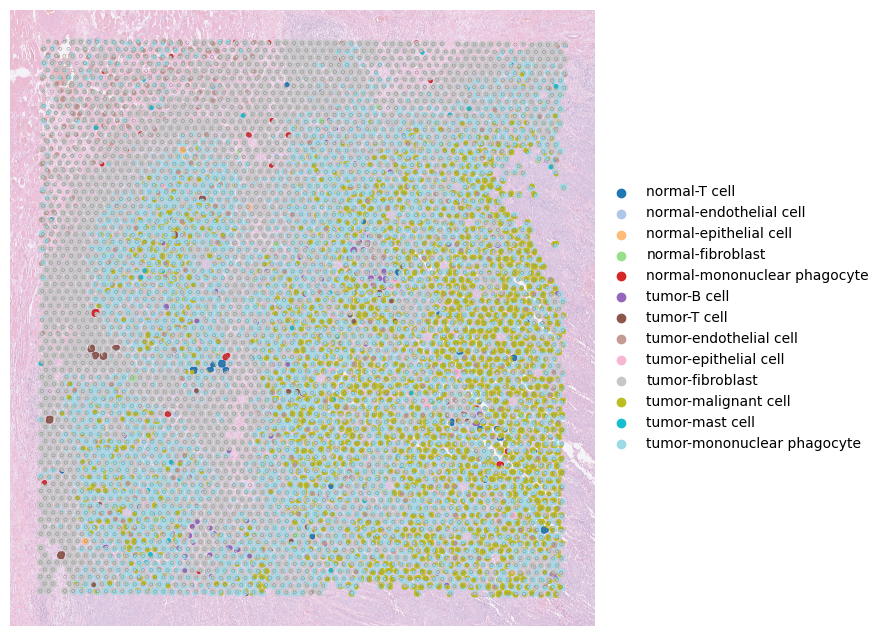

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8), dpi=100)
fig.patch.set_alpha(0.1)
PlotVisiumCells(sp_adata, "discrete_label_ct", size=1.5, alpha_img=0.4, lw=0.3, ax=ax)

In [25]:
labels = pd.Series(sp_adata.uns["cell_locations"]["discrete_label_ct"])
target_labels = ["tumor-malignant cell", "tumor-fibroblast", "tumor-T cell"]
filtered_labels = labels[labels.isin(target_labels)]
sp_adata.uns["cell_locations"]["discrete_label_ct"] = filtered_labels

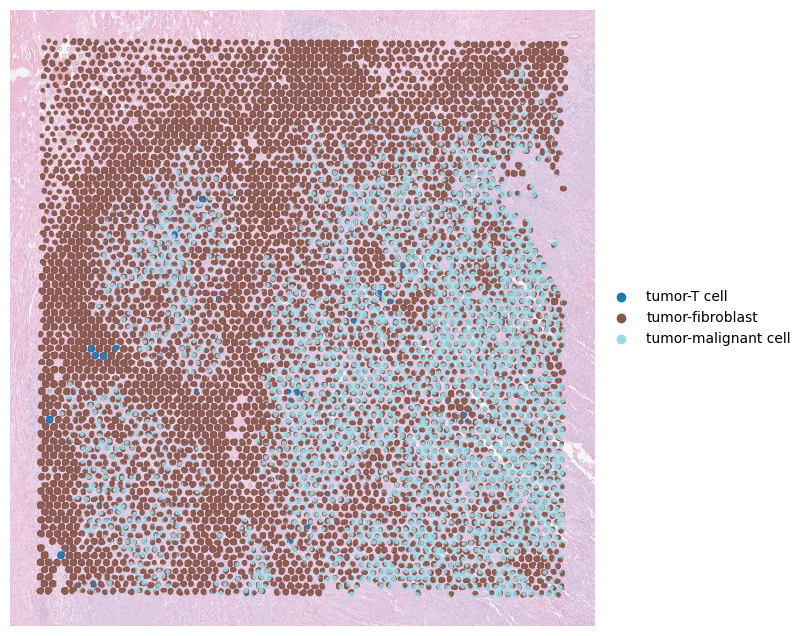

In [30]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8), dpi=100)
fig.patch.set_alpha(0.1)
PlotVisiumCells(sp_adata, "discrete_label_ct", size=1.5, alpha_img=0.4, lw=0.3, ax=ax)

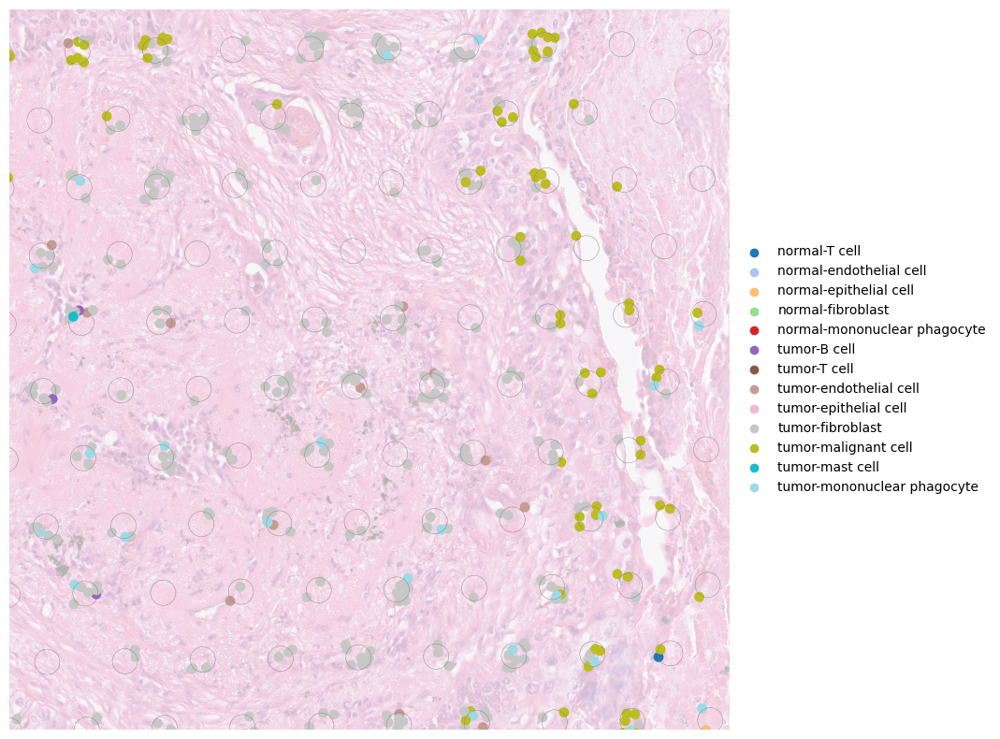

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8), dpi=100)
fig.patch.set_alpha(0.1)
PlotVisiumCells(sp_adata, "discrete_label_ct", size=0.4, alpha_img=0.3, lw=0.3, ax=ax)
ax.set_xlim(9500, 11500)
ax.set_ylim(10000, 12000)
ax.axis("off")
plt.tight_layout()
plt.show()

### Gene expression decomposition

In [14]:
# gene_adata = [
#     sc.read(f"{base_path_sp_data}/generated_cells_spot{start}_{end}.h5ad")
#     for start, end in spot_ranges
# ]
# gene_adata = gene_adata[0].concatenate(
#     gene_adata[1:], batch_key="_", uns_merge="unique", index_unique=None
# )
# gene_adata.uns = sp_adata.uns
# gene_adata

In [15]:
shared_vars = gene_adata.var_names.intersection(sc_adata.var_names)
gene_adata.var.loc[shared_vars, "feature_name"] = sc_adata.var.loc[
    shared_vars, "feature_name"
]

In [16]:
id_names = pd.DataFrame(
    {
        "ensemble_ids": np.array(gene_adata.var_names, dtype=str),
        "gene_names": gene_adata.var["feature_name"].to_xarray(),
    }
)
id_names

,ensemble_ids,gene_names
0,ENSG00000000971,CFH
1,ENSG00000001617,SEMA3F
2,ENSG00000002330,BAD
3,ENSG00000002586,CD99_ENSG00000002586
4,ENSG00000003436,TFPI
...,...,...
2159,ENSG00000283703,VSIG10L2
2160,ENSG00000284634,ENSG00000284634.1
2161,ENSG00000287714,ENSG00000287714.1
2162,ENSG00000287859,ENSG00000287859.1


In [17]:
def gene_name_id(gene_name: str, id_names: pd.DataFrame = id_names):
    """function to find correspondance from gene name to ensembl id"""
    ensemble_id = id_names["ensemble_ids"][id_names["gene_names"] == gene_name]
    if len(ensemble_id) != 0:
        return ensemble_id.iloc[0]
    else:
        return print("Not in genes")


def id_gene_name(ensemble_id: str, id_names: pd.DataFrame = id_names):
    """function to find correspondance from ensembl id to gene name"""
    gene_name = id_names.loc[id_names["ensemble_ids"] == ensemble_id, "gene_names"]
    if len(gene_name) != 0:
        return gene_name.iloc[0]
    else:
        return print("Not in genes")

### Gene single cell spatial expression

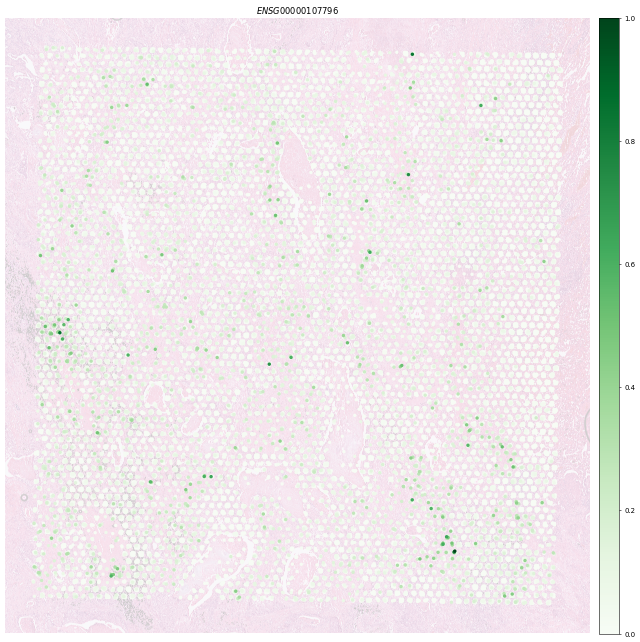

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(24, 16), dpi=50)
PlotVisiumGene(
    gene_adata, "ENSG00000107796", ax=ax, size=3, alpha_img=0.2, palette="Greens"
)
# "ENSG00000107796" -> "ACTA2"

In [20]:
# fig, ax = plt.subplots(1, 1, figsize=(24, 16), dpi=50)
# PlotVisiumGene(
#     gene_adata, "ENSG00000133392", ax=ax, size=3, alpha_img=0.2, palette="Greens"
# )
# # "ENSG00000133392" -> "MYH11"

In [21]:
# fig, ax = plt.subplots(1, 1, figsize=(24, 16), dpi=50)
# PlotVisiumGene(
#     gene_adata, "ENSG00000196616", ax=ax, size=3, alpha_img=0.2, palette="Greens"
# )
# # "ENSG00000196616" -> "ADH1B"

In [22]:
# fig, ax = plt.subplots(1, 1, figsize=(24, 16), dpi=50)
# PlotVisiumGene(
#     gene_adata, "ENSG00000198851", ax=ax, size=4, alpha_img=0.2, palette="Greens"
# )
# # "ENSG00000198851" -> "CD3E"

In [23]:
# fig, ax = plt.subplots(1, 1, figsize=(24, 16), dpi=50)
# PlotVisiumGene(
#     gene_adata, "ENSG00000143384", ax=ax, size=4, alpha_img=0.2, palette="Greens"
# )
# id_gene_name("ENSG00000143384")

In [24]:
# fig, ax = plt.subplots(1, 1, figsize=(24, 16), dpi=50)
# PlotVisiumGene(
#     gene_adata, "ENSG00000110092", ax=ax, size=4, alpha_img=0.2, palette="Greens"
# )
# id_gene_name("ENSG00000110092")

In [25]:
def cell_type_condition(
    cell_type: str,
    cell_type_column_name: str = "discrete_label_ct",
    sp_adata: anndata.AnnData = gene_adata,
):
    return sp_adata.obs[cell_type_column_name] == cell_type


def PlotVisiumGene_CellType(
    cell_type: str,
    ensemble_id: str,
    cell_type_column_name: str = "discrete_label_ct",
    sp_adata: anndata.AnnData = gene_adata,
):
    cell_cond = cell_type_condition(cell_type, cell_type_column_name, sp_adata)
    fig, ax = plt.subplots(1, 2, figsize=(40, 16), dpi=50)
    PlotVisiumGene(
        sp_adata[cell_cond],
        ensemble_id,
        ax=ax[1],
        size=4,
        alpha_img=0.2,
        palette="Greens",
    )
    PlotVisiumGene(
        sp_adata,
        ensemble_id,
        ax=ax[0],
        size=4,
        alpha_img=0.2,
        palette="Greens",
    )

In [26]:
# PlotVisiumGene_CellType("tumor-malignant cell", "ENSG00000110092")
# id_gene_name("ENSG00000110092")

### Analysis of single cell deconvolution of transcriptomic data

In [27]:
gene_adata

AnnData object with n_obs × n_vars = 34559 × 2164
    obs: 'x', 'y', 'spot_index', 'cell_index', 'cell_nums', 'discrete_label', 'discrete_label_ct', '_'
    var: 'feature_name'
    uns: 'cell_locations', 'spatial'

In [28]:
gene_adata.X[0:5, 0:5]

array([[2.6927192e-03, 1.4444034e-02, 5.8809123e-03, 8.9544849e-03,
        5.3648949e-03],
       [8.9315575e-04, 1.7057816e-02, 4.1870675e-03, 1.4808198e+01,
        1.7357668e-03],
       [1.4775991e-03, 2.0597657e-02, 5.1528215e-03, 2.0490887e+01,
        0.0000000e+00],
       [7.6171336e+00, 1.7743429e-02, 5.6213536e-03, 5.3554836e+01,
        0.0000000e+00],
       [7.6263480e+00, 2.4014354e-02, 0.0000000e+00, 3.3877294e-03,
        0.0000000e+00]], dtype=float32)

In [29]:
print(
    gene_adata.var["feature_name"][gene_adata.var["feature_name"].str.startswith("MT-")]
)  # .value_counts(dropna=False)
gene_adata.var["mt"] = gene_adata.var_names.str.startswith("MT-")

gene_ids_2
ENSG00000198712     MT-CO2
ENSG00000198727     MT-CYB
ENSG00000198763     MT-ND2
ENSG00000198786     MT-ND5
ENSG00000198840     MT-ND3
ENSG00000198886     MT-ND4
ENSG00000198888     MT-ND1
ENSG00000198899    MT-ATP6
ENSG00000198938     MT-CO3
ENSG00000210082    MT-RNR2
ENSG00000211459    MT-RNR1
ENSG00000228253    MT-ATP8
Name: feature_name, dtype: category
Categories (25520, object): ['A1BG', 'A1BG-AS1', 'A1CF', 'A2M', ..., 'ZYG11B', 'ZYX', 'ZZEF1', 'ZZZ3']


In [30]:
print(
    gene_adata.var["feature_name"][
        gene_adata.var["feature_name"].str.startswith(("RPS-", "RPL-"))
    ]
)
gene_adata.var["feature_name"][
    gene_adata.var["feature_name"].str.startswith("^HB[^(P)]")
]

Series([], Name: feature_name, dtype: category
Categories (25520, object): ['A1BG', 'A1BG-AS1', 'A1CF', 'A2M', ..., 'ZYG11B', 'ZYX', 'ZZEF1', 'ZZZ3'])


Series([], Name: feature_name, dtype: category
Categories (25520, object): ['A1BG', 'A1BG-AS1', 'A1CF', 'A2M', ..., 'ZYG11B', 'ZYX', 'ZZEF1', 'ZZZ3'])

In [31]:
sc.pp.calculate_qc_metrics(gene_adata, qc_vars=["mt"], inplace=True, log1p=True)

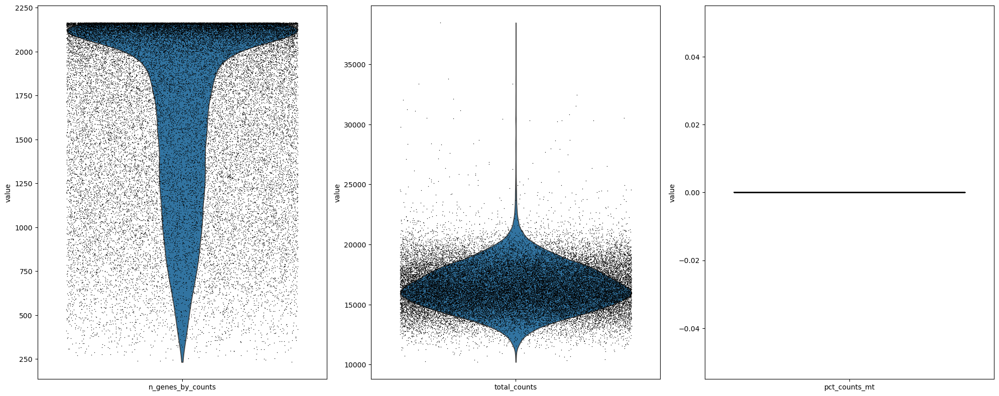

In [32]:
fig, ax = plt.subplots(1, 3, figsize=(20, 8), dpi=100)
for i, colunm in enumerate(["n_genes_by_counts", "total_counts", "pct_counts_mt"]):
    sc.pl.violin(gene_adata, colunm, jitter=0.4, ax=ax[i], show=False)
plt.tight_layout()
plt.show()

## Umap of sc data inferred from sp data

In [33]:
sc_adata.X[0:5, 0:5].toarray()

array([[2.0640206, 0.       , 2.4262502, 1.4903817, 0.       ],
       [0.       , 0.       , 2.2031724, 0.       , 0.       ],
       [0.       , 0.       , 0.       , 0.       , 0.       ],
       [0.       , 0.       , 0.       , 0.       , 0.       ],
       [0.       , 0.       , 0.       , 0.       , 0.       ]],
      dtype=float32)

In [34]:
gene_adata.obs.rename(columns={"discrete_label_ct": "sample_cell_type"}, inplace=True)

In [35]:
gene_adata.X[0:5, 0:5]

array([[2.6927192e-03, 1.4444034e-02, 5.8809123e-03, 8.9544849e-03,
        5.3648949e-03],
       [8.9315575e-04, 1.7057816e-02, 4.1870675e-03, 1.4808198e+01,
        1.7357668e-03],
       [1.4775991e-03, 2.0597657e-02, 5.1528215e-03, 2.0490887e+01,
        0.0000000e+00],
       [7.6171336e+00, 1.7743429e-02, 5.6213536e-03, 5.3554836e+01,
        0.0000000e+00],
       [7.6263480e+00, 2.4014354e-02, 0.0000000e+00, 3.3877294e-03,
        0.0000000e+00]], dtype=float32)

In [36]:
gene_adata.X.max()

21907.547

In [37]:
sc.pp.log1p(gene_adata)

In [38]:
gene_adata.X.max(), sc_adata.X.max()

(9.994632, 10.010002)

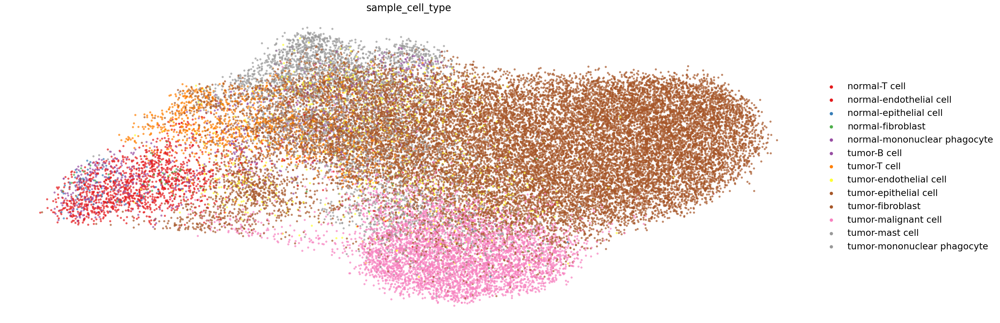

In [39]:
gene_adata.uns["log1p"]["base"] = None
sc.pp.highly_variable_genes(gene_adata, n_top_genes=500)
sc.tl.pca(gene_adata, n_comps=30, use_highly_variable=True)
sc.pp.neighbors(gene_adata, n_neighbors=20, n_pcs=30)
sc.tl.umap(gene_adata, min_dist=0.5, spread=1.0, maxiter=50)
fig, axs = plt.subplots(1, 1, figsize=(30, 10), dpi=100)
plt.rcParams["legend.markerscale"] = 1.3
sns.set_context("paper", font_scale=2.2)
sc.pl.umap(
    gene_adata,
    color="sample_cell_type",
    size=80,
    frameon=False,
    palette="Set1",
    alpha=0.7,
    show=False,
    ax=axs,  # ,legend_loc='on data'
)
plt.tight_layout()

## Umap of sc ref data

In [40]:
sc_adata

AnnData object with n_obs × n_vars = 26387 × 25520
    obs: 'nCount_RNA', 'nFeature_RNA', 'harm_study', 'harm_healthy.tissue', 'harm_tumor.site', 'harm_sample.type', 'harm_condition', 'harm_tumor.type', 'harm_cd45pos', 'harm_healthy.pat', 'percent.mt', 'ratio_nCount_nFeature', 'batch', 'X_scvi_batch', 'X_scvi_labels', 'X_scvi_local_l_mean', 'X_scvi_local_l_var', 'leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_0.8', 'leiden_1', 'leiden_1.2', 'leiden_1.4', 'author_first_cell_type', 'author_cell_type', 'cnv_score', 'organism_ontology_term_id', 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'suspension_type', 'assay_ontology_term_id', 'is_primary_data', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'n_counts', 'sample_cell_type'
    va

In [41]:
sc_adata.uns["log1p"]["base"] = None
sc.pp.highly_variable_genes(sc_adata, n_top_genes=500)
sc.tl.pca(sc_adata, n_comps=30, use_highly_variable=True)

In [42]:
sc.pp.neighbors(sc_adata, n_neighbors=20, n_pcs=30)
sc.tl.umap(sc_adata, min_dist=0.5, spread=1.0, maxiter=50)

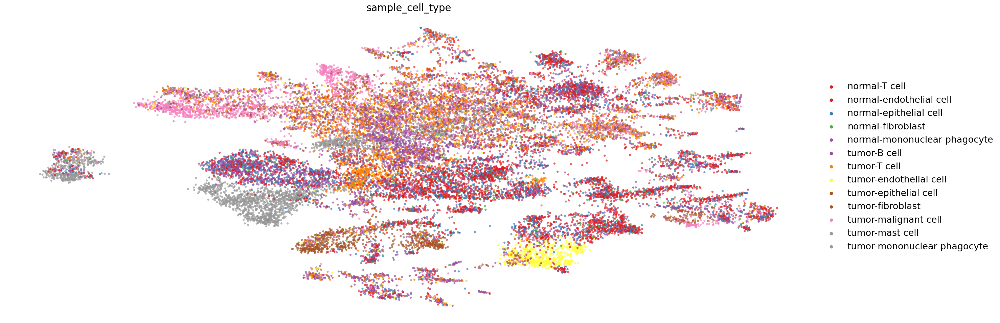

In [43]:
fig, axs = plt.subplots(1, 1, figsize=(30, 10), dpi=100)
plt.rcParams["legend.markerscale"] = 1.3
sns.set_context("paper", font_scale=2.2)
sc.pl.umap(
    sc_adata,
    color="sample_cell_type",
    size=80,
    frameon=False,
    palette="Set1",
    alpha=0.7,
    show=False,
    ax=axs,  # ,legend_loc='on data'
)
plt.tight_layout()

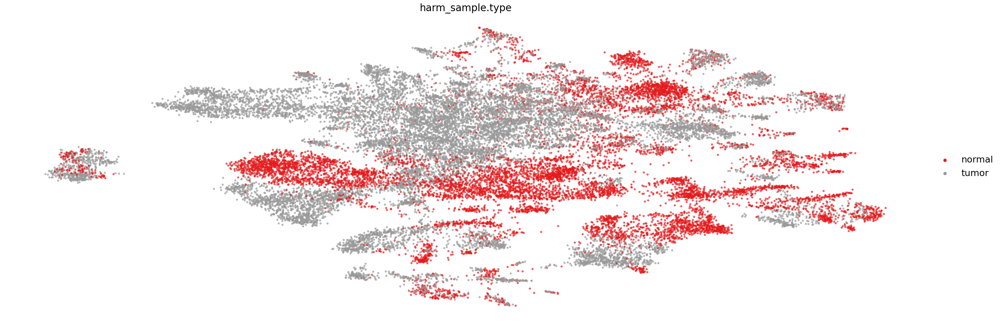

In [44]:
fig, axs = plt.subplots(1, 1, figsize=(30, 10), dpi=100)
plt.rcParams["legend.markerscale"] = 1.3
sns.set_context("paper", font_scale=2.2)
sc.pl.umap(
    sc_adata,
    color="harm_sample.type",
    size=80,
    frameon=False,
    palette="Set1",
    alpha=0.7,
    show=False,
    ax=axs,  # ,legend_loc='on data'
)
plt.tight_layout()

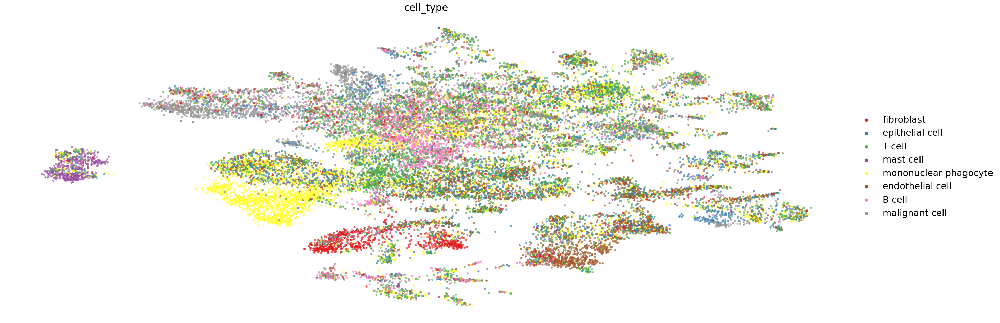

In [45]:
fig, axs = plt.subplots(1, 1, figsize=(30, 10), dpi=100)
plt.rcParams["legend.markerscale"] = 1.3
sns.set_context("paper", font_scale=2.2)
sc.pl.umap(
    sc_adata,
    color="cell_type",
    size=80,
    frameon=False,
    palette="Set1",
    alpha=0.7,
    show=False,
    ax=axs,  # ,legend_loc='on data'
)
plt.tight_layout()

## Combined umap for sc ref data and sc inferred dat from sp data

In [46]:
shared_genes = gene_adata.var_names.intersection(sc_adata.var_names)
sc_aligned = sc_adata[:, shared_genes]
gene_aligned = gene_adata[:, shared_genes]

In [47]:
sc_adata.uns["log1p"]["base"] = None
sc.pp.highly_variable_genes(sc_adata, n_top_genes=500)
sc.tl.pca(sc_adata, n_comps=30, use_highly_variable=True)

In [48]:
pcs = sc_aligned.varm["PCs"]
gene_aligned.obsm["X_pca"] = (gene_aligned.X - sc_aligned.X.mean(0)) @ pcs

In [49]:
sc_all_adata = sc_aligned.concatenate(gene_aligned)

In [50]:
sc_all_adata.varm["PCs"] = pcs
sc_all_adata.raw = sc_all_adata
sc.pp.neighbors(sc_all_adata, n_neighbors=20, n_pcs=30)
sc.tl.umap(sc_all_adata, min_dist=0.5, spread=1.0, maxiter=50)

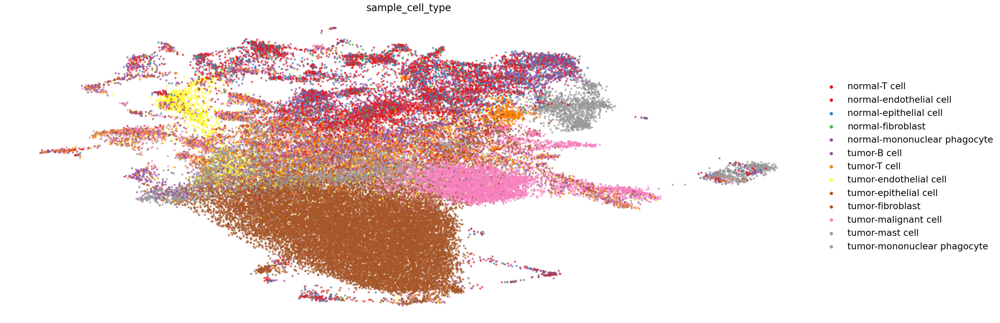

In [51]:
fig, axs = plt.subplots(1, 1, figsize=(30, 10), dpi=100)
plt.rcParams["legend.markerscale"] = 1.3
sns.set_context("paper", font_scale=2.2)
sc.pl.umap(
    sc_all_adata,
    color="sample_cell_type",
    size=80,
    frameon=False,
    palette="Set1",
    alpha=0.7,
    show=False,
    ax=axs,  # ,legend_loc='on data'
)
plt.tight_layout()

## Compare nodes of sizek model and inferred sc data from sp data

In [52]:
sizek_df = pd.read_csv(
    "/home/agathes/work/PhysiBoSS_Personalisation/models/sizek_dictionary.csv"
)

In [53]:
sizek_df

,Nodes,Genes
0,A_KINETOCHORES,Not_assigned
1,AKT_B,AKT1
2,AKT_H,Not_assigned
3,ATR,ATR
4,BAD,BAD
...,...,...
85,Trail,TNFSF10
86,TSC2,TSC2
87,U_KINETOCHORES,Not_assigned
88,UbcH10,UBCH10


In [54]:
sizek_gene_nodes = sorted(
    sizek_df["Genes"][sizek_df["Genes"] != "Not_assigned"].to_list()
)
sizek_gene_nodes

['AKT1',
 'AKT1S1',
 'ATR',
 'BAD',
 'BAX',
 'BCL2',
 'BCL2L1',
 'BCL2L11',
 'BID',
 'BIK',
 'BRAF',
 'CA2',
 'CAD',
 'CASP2',
 'CASP3',
 'CASP8',
 'CASP9',
 'CCNA1',
 'CCNB1',
 'CCND1',
 'CCNE1',
 'CDC20',
 'CDC25A',
 'CDC25B',
 'CDC25C',
 'CDC6',
 'CDH1',
 'CDK1',
 'CDKN1A',
 'CDKN1B',
 'CDT1',
 'CHEK1',
 'E2F1',
 'ECT2',
 'EIF4E',
 'FOXM1',
 'FOXO1',
 'FOXO3',
 'GRB2',
 'GSK3B',
 'KRAS',
 'MTOR',
 'MYC',
 'NEDDL4',
 'PDK1',
 'PIK3CA',
 'PLK1',
 'RHEB',
 'RICTOR',
 'RPS6KB1',
 'TNFSF10',
 'TSC2',
 'UBCH10',
 'WEE1']

In [55]:
def convert_genes_ensembles(gene_list):
    mg = mygene.MyGeneInfo()
    ensembl_dict = mg.querymany(
        gene_list, scopes="symbol", fields="ensembl.gene", species="human"
    )
    ensembl_list = []
    for gene in ensembl_dict:
        ensembl = gene.get("ensembl")
        if isinstance(ensembl, dict):
            ensembl_list.append([gene["query"], ensembl["gene"]])
        elif isinstance(ensembl, list) and len(ensembl) > 0:
            ensembl_list.append([gene["query"], ensembl[0]["gene"]])
    return np.array(ensembl_list)

In [56]:
sizek_ensembl = convert_genes_ensembles(sizek_gene_nodes)
sizek_ensembl

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
2 input query terms found no hit:	['NEDDL4', 'UBCH10']


array([['AKT1', 'ENSG00000142208'],
       ['AKT1S1', 'ENSG00000204673'],
       ['ATR', 'ENSG00000175054'],
       ['BAD', 'ENSG00000002330'],
       ['BAX', 'ENSG00000087088'],
       ['BCL2', 'ENSG00000171791'],
       ['BCL2L1', 'ENSG00000171552'],
       ['BCL2L11', 'ENSG00000153094'],
       ['BID', 'ENSG00000015475'],
       ['BIK', 'ENSG00000100290'],
       ['BRAF', 'ENSG00000157764'],
       ['CA2', 'ENSG00000104267'],
       ['CAD', 'ENSG00000084774'],
       ['CASP2', 'ENSG00000106144'],
       ['CASP3', 'ENSG00000164305'],
       ['CASP8', 'ENSG00000064012'],
       ['CASP9', 'ENSG00000132906'],
       ['CCNA1', 'ENSG00000133101'],
       ['CCNB1', 'ENSG00000134057'],
       ['CCND1', 'ENSG00000110092'],
       ['CCNE1', 'ENSG00000105173'],
       ['CDC20', 'ENSG00000117399'],
       ['CDC25A', 'ENSG00000164045'],
       ['CDC25B', 'ENSG00000101224'],
       ['CDC25C', 'ENSG00000158402'],
       ['CDC6', 'ENSG00000094804'],
       ['CDH1', 'ENSG00000039068'],
       ['CDK1

In [57]:
sp_genes = sorted(gene_adata.var["feature_name"].to_list())
sp_ensembl = convert_genes_ensembles(sp_genes)
sp_ensembl

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
55 input query terms found dup hits:	[('ACTE1P', 2), ('ATP11B-DT', 2), ('C22orf46P', 2), ('CCDC18-AS1', 2), ('CDC42-IT1', 2), ('CHASERR',
228 input query terms found no hit:	['C12orf40', 'C20orf85', 'C21orf62-AS1', 'C2orf88', 'C3_ENSG00000125730', 'C4orf3', 'C7_ENSG00000112


array([['A2M', 'ENSG00000175899'],
       ['AANAT', 'ENSG00000129673'],
       ['ACAP1', 'ENSG00000072818'],
       ...,
       ['ZPBP2', 'ENSG00000186075'],
       ['ZPLD1', 'ENSG00000170044'],
       ['ZSCAN10', 'ENSG00000130182']], dtype='<U25')

In [58]:
common_gene = list(set(sizek_ensembl[:, 1]) & set(sp_ensembl[:, 1]))
common_gene

['ENSG00000106144',
 'ENSG00000133101',
 'ENSG00000164305',
 'ENSG00000157764',
 'ENSG00000150907',
 'ENSG00000002330',
 'ENSG00000204673',
 'ENSG00000133703',
 'ENSG00000136997',
 'ENSG00000164327',
 'ENSG00000152256',
 'ENSG00000142208',
 'ENSG00000015475',
 'ENSG00000064012',
 'ENSG00000124762',
 'ENSG00000175054',
 'ENSG00000108443',
 'ENSG00000164045',
 'ENSG00000198793',
 'ENSG00000171791',
 'ENSG00000110092',
 'ENSG00000106615',
 'ENSG00000171552',
 'ENSG00000118689',
 'ENSG00000087088',
 'ENSG00000134057',
 'ENSG00000101412',
 'ENSG00000166851',
 'ENSG00000167513',
 'ENSG00000158402',
 'ENSG00000117399',
 'ENSG00000111276',
 'ENSG00000166483',
 'ENSG00000084774',
 'ENSG00000151247',
 'ENSG00000101224',
 'ENSG00000170312',
 'ENSG00000153094',
 'ENSG00000100290',
 'ENSG00000094804',
 'ENSG00000103197',
 'ENSG00000149554',
 'ENSG00000121879',
 'ENSG00000121858',
 'ENSG00000105173',
 'ENSG00000132906',
 'ENSG00000039068',
 'ENSG00000111206',
 'ENSG00000104267',
 'ENSG00000177885',
